<a href="https://colab.research.google.com/github/RVasconcelosMiguel/PerceptionMapping/blob/main/PMT3_novo_kalman.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<Body>   
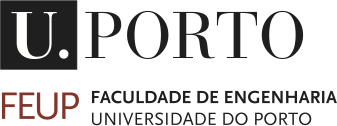   
<h1> <b>Perception and Mapping Project 2(Part 2) (1<sup>nd</sup> semester) </b> </h1>
<p>Master in Electrical and Computer Engineering </p>
<p>Department of Electrical and Computer Engineering</p>
</Body>  

### **Developed by:**
*   Bernardo de Almeida Soeiro - up202008204
*   Rodrigo de Vasconcelos e Miguel - up202008406

FEUP, Dec. 2024

---




## Data initialization


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Load data
data = np.loadtxt('/content/data_slam.txt')

# Extract sections of the data
pose_data = data[:, :3]  # Pose variations: Δx, Δy, Δtheta
lidar_data = data[:, 3:]   # LIDAR measurements

# Parameters for LIDAR
angles = np.deg2rad(np.linspace(-30, 30, 61))  # Angles from -30° to 30°

## Task 1


Corner Types: []

Corner Angles (rad): []


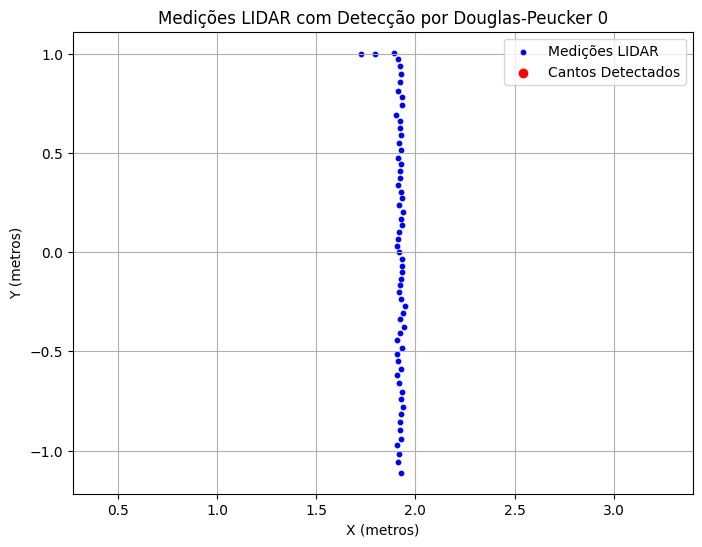


Corner Types: []

Corner Angles (rad): []


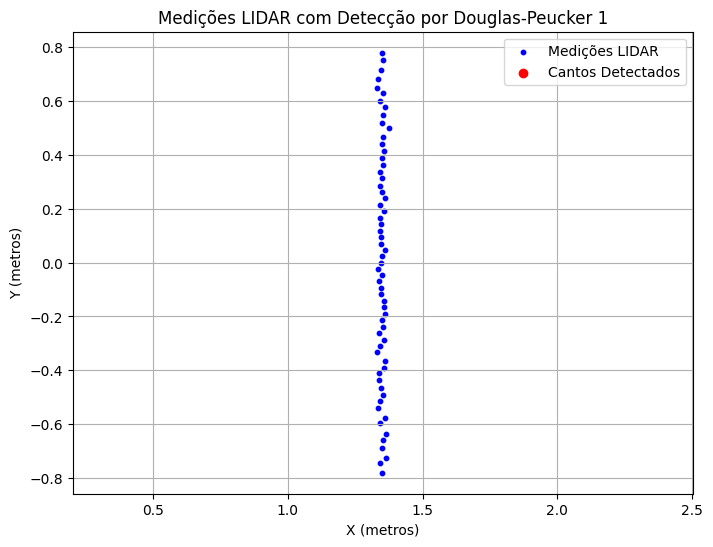


Corner Types: []

Corner Angles (rad): []


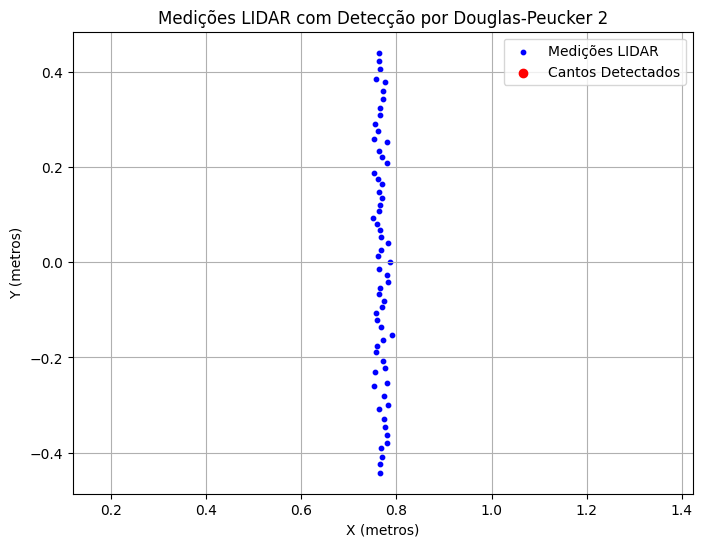


Corner Types: []

Corner Angles (rad): []


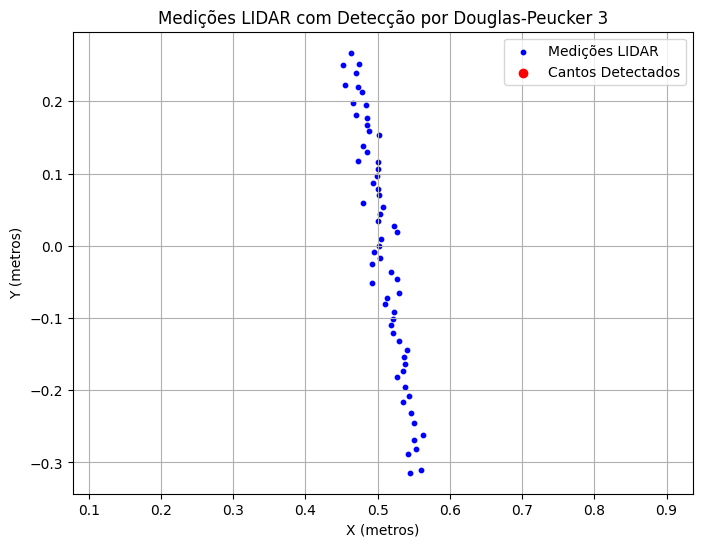


Corner Types: []

Corner Angles (rad): []


KeyboardInterrupt: 

In [282]:
import numpy as np
import matplotlib.pyplot as plt

# Função para converter medições LIDAR para coordenadas cartesianas


def lidar_to_cartesian(lidar_data, angles):
    x_coords = lidar_data * np.cos(angles)
    y_coords = lidar_data * np.sin(angles)
    return np.vstack((x_coords, y_coords)).T  # Transposta para (N, 2)

# Implementação do algoritmo Douglas-Peucker
def douglas_peucker(points, epsilon):
    """
    Simplifica uma linha poligonal usando o algoritmo Douglas-Peucker.
    :param points: Lista de pontos [(x1, y1), (x2, y2), ...].
    :param epsilon: Distância mínima para manter um ponto.
    :return: Pontos simplificados [(x1, y1), (xk, yk), ...].
    """
    # Encontrar a distância máxima de um ponto à linha inicial-final
    start, end = points[0], points[-1]
    line_vector = end - start
    line_length = np.linalg.norm(line_vector)

    if line_length == 0:
        distances = np.linalg.norm(points - start, axis=1)
    else:
        normalized_vector = line_vector / line_length
        projections = np.dot(points - start, normalized_vector)
        projections_points = start + np.outer(projections, normalized_vector)
        distances = np.linalg.norm(points - projections_points, axis=1)

    max_dist_idx = np.argmax(distances)
    max_dist = distances[max_dist_idx]

    # Dividir recursivamente se a distância máxima for maior que epsilon
    if max_dist > epsilon:
        left = douglas_peucker(points[:max_dist_idx + 1], epsilon)
        right = douglas_peucker(points[max_dist_idx:], epsilon)
        return np.vstack((left[:-1], right))
    else:
        return np.array([start, end])

def are_angles_opposed(angle1, angle2, tolerance=np.radians(45)):
    """
    Check if two normalized angles are approximately in opposite directions (~= π radians apart).

    :param angle1: First angle in radians (assumed normalized within [-π, π)).
    :param angle2: Second angle in radians (assumed normalized within [-π, π)).
    :param tolerance: Tolerance in radians for considering angles opposed (~= π).
                      Default is 5 degrees converted to radians.
    :return: True if the angles are approximately opposite, False otherwise.
    """
    # Ensure angles are normalized to [-π, π)
    angle1 = (angle1 + np.pi) % (2 * np.pi) - np.pi
    angle2 = (angle2 + np.pi) % (2 * np.pi) - np.pi

    # Compute the absolute difference
    angle_diff = np.abs(angle1 - angle2)

    # Check if the difference is close to π (accounting for wraparound)
    return np.abs(angle_diff - np.pi) <= tolerance

def get_angle_and_type_linear(lidar_data, corner_idx, window_size):
    """
    Calculate the angle and type (convex or concave) for a corner point using linear approximation.

    :param lidar_data: Cartesian coordinates of LiDAR points (Nx2 array).
    :param corner_idx: Index of the corner point in the data.
    :param window_size: Number of points before and after the corner to consider for linear fit.
    :return: Type (1 for concave, 0 for convex), angle in radians, and keep flag (1 if valid, 0 if not).
    """
    keep = 1
    bef_points = []
    aft_points = []

    # Collecting before and after points
    bef_points.append(lidar_data[corner_idx])
    bef_idx = corner_idx - window_size
    if bef_idx < 0:
        bef_idx = 0
    dist_points = np.sqrt((lidar_data[corner_idx, 0] - lidar_data[bef_idx, 0])**2 + (lidar_data[corner_idx, 1] - lidar_data[bef_idx, 1])**2)
    if dist_points > 0.5:
        bef_idx+=1
    bef_points.append(lidar_data[bef_idx])
    aft_points.append(lidar_data[corner_idx])
    aft_idx = corner_idx + window_size
    if aft_idx > len(lidar_data) - 1:
        aft_idx = len(lidar_data) - 1
    aft_points.append(lidar_data[aft_idx])

    # Convert to numpy arrays
    bef_points = np.array(bef_points)
    aft_points = np.array(aft_points)

    # Compute slopes and intercepts for before and after segments
    x_bef = bef_points[:, 0]
    y_bef = bef_points[:, 1]
    slope_bef, intercept_bef = np.polyfit(x_bef, y_bef, 1)
    y_bef_ini = slope_bef * bef_points[0, 0] + intercept_bef
    y_bef_end = slope_bef * bef_points[1, 0] + intercept_bef
    vector_bef = np.array([bef_points[1, 0] - bef_points[0, 0], y_bef_end - y_bef_ini])
    angle_bef = np.arctan2(vector_bef[1], vector_bef[0])

    x_aft = aft_points[:, 0]
    y_aft = aft_points[:, 1]
    slope_aft, intercept_aft = np.polyfit(x_aft, y_aft, 1)
    y_aft_ini = slope_aft * aft_points[0, 0] + intercept_aft
    y_aft_end = slope_aft * aft_points[1, 0] + intercept_aft
    vector_aft = np.array([aft_points[1, 0] - aft_points[0, 0], y_aft_end - y_aft_ini])
    angle_aft = np.arctan2(vector_aft[1], vector_aft[0])


    # Check if angles are opposed
    if are_angles_opposed(angle_bef, angle_aft) == 1:
        keep = 0
        return 0, 0, keep

    # Compute final angle
    vector = (
        vector_bef / np.sqrt(vector_bef[0] ** 2 + vector_bef[1] ** 2)
        + vector_aft / np.sqrt(vector_aft[0] ** 2 + vector_aft[1] ** 2)
    )
    angle_f = np.arctan2(vector[1], vector[0])

    # Determine if corner is concave or convex
    cross_product = vector_bef[0] * vector_aft[1] - vector_bef[1] * vector_aft[0]
    corner_type = 1 if cross_product < 0 else 0  # 1: Concave, 0: Convex

    return corner_type, angle_f, keep


# Main function for detecting corners using Douglas-Peucker
def detect_corners_douglas_peucker(lidar_data, angles, epsilon=0.1, radius=0.79, window_size=3): #radius=0.79
    corners = []
    lidar_cartesian = lidar_to_cartesian(lidar_data, angles)  # Convert to Cartesian coordinates

    # Simplify the line using Douglas-Peucker
    simplified_points = douglas_peucker(lidar_cartesian, epsilon)

    # Detect indices of simplified points in the original data
    for point in simplified_points:
        idx = np.where((lidar_cartesian == point).all(axis=1))[0]
        if len(idx) > 0:
            corners.append(idx[0])

    # Filter out the first and last points
    corners = [idx for idx in corners if idx != 0 and idx != len(lidar_cartesian) - 1]

    # Perform filtering based on distance to adjacent points
    filtered_corners = []
    filtered_corners_type = []
    filtered_corners_angle = []
    filtered_corner_coords = []


    for corner_idx in corners:
        prev_idx = corner_idx - 1
        next_idx = corner_idx + 1

        if prev_idx >= 0 and next_idx < len(lidar_cartesian):
            prev_point = lidar_cartesian[prev_idx]
            next_point = lidar_cartesian[next_idx]
            corner_point = lidar_cartesian[corner_idx]

            # Calculate distances to the adjacent points
            dist_to_prev = np.linalg.norm(corner_point - prev_point)
            dist_to_next = np.linalg.norm(corner_point - next_point)

            # Keep the corner only if both adjacent points are within the radius
            if dist_to_prev <= radius and dist_to_next <= radius:
                # Get convex/concave type and angle
                c_type, c_angle, keep = get_angle_and_type_linear(lidar_cartesian, corner_idx, window_size)
                if keep==1:
                  filtered_corners_type.append(c_type)
                  filtered_corners_angle.append(c_angle)
                  filtered_corners.append(corner_idx)
                  filtered_corner_coords.append(corner_point)

    return filtered_corners, filtered_corners_type, filtered_corners_angle, filtered_corner_coords



# Plotar medições LIDAR com os cantos detectados
def plot_lidar_with_corners(lidar_data, corners, angles, corner_coords, corner_angles, iter):
    x_coords, y_coords = lidar_to_cartesian(lidar_data, angles).T
    corner_x, corner_y = x_coords[corners], y_coords[corners]

    plt.figure(figsize=(8, 6))
    plt.scatter(x_coords, y_coords, s=10, label="Medições LIDAR", color='b')
    plt.scatter(corner_x, corner_y, color='r', label="Cantos Detectados", zorder=5)

    # Plot vectors for each corner
    for (x, y), angle in zip(corner_coords, corner_angles):
        vector_length = 0.3  # Length of the vector
        dx = vector_length * np.cos(angle)
        dy = vector_length * np.sin(angle)

        plt.arrow(x, y, dx, dy, head_width=0.05, head_length=0.1, color='orange', label="Direção do Canto")

        # Annotate the angle in radians
        plt.text(x + dx / 2, y + dy / 2, f"{angle:.2f} rad", color='orange', fontsize=8)

    plt.axis("equal")
    plt.title(f"Medições LIDAR com Detecção por Douglas-Peucker {iter}")
    plt.xlabel("X (metros)")
    plt.ylabel("Y (metros)")
    plt.legend()
    plt.grid(True)
    plt.show()



class Corner:
    def __init__(self, position, corner_type, facing_angle=None):
        self.position = position  # [x, y]
        self.corner_type = corner_type  # 'convex' ou 'concave'
        self.facing_angle = facing_angle  # Ângulo que o canto está enfrentando (opcional)

    def __str__(self):
        return f"Corner(position={self.position}, type={self.corner_type}, facing_angle={self.facing_angle})"



# Iterar sobre as leituras LIDAR
for i in range(len(lidar_data)):
    lidar_row = lidar_data[i]
    corners, corners_type, corners_angle, corner_coords = detect_corners_douglas_peucker(lidar_row, angles)

    # Print corner information
    print("\nCorner Types:", corners_type)
    print("\nCorner Angles (rad):", corners_angle)

    # Plot LIDAR data with corners and vectors
    plot_lidar_with_corners(lidar_row, corners, angles, corner_coords, corners_angle, i)

## Task 2

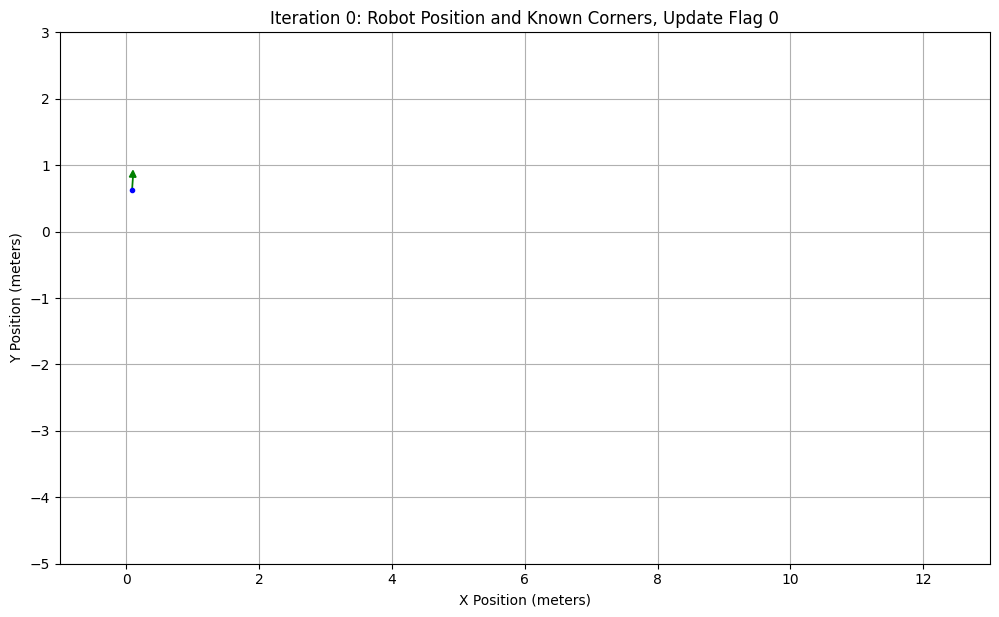

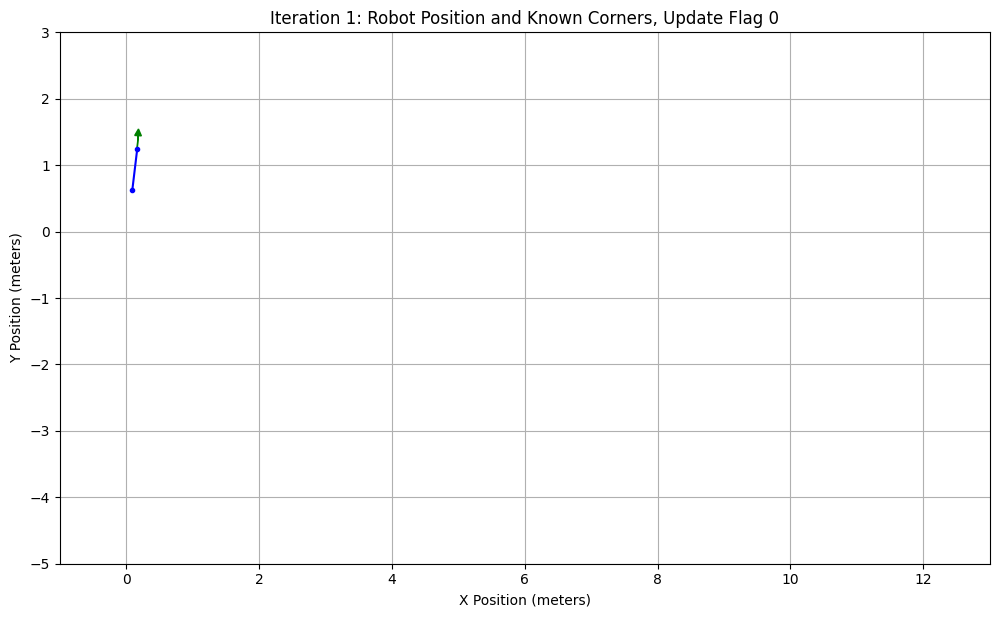

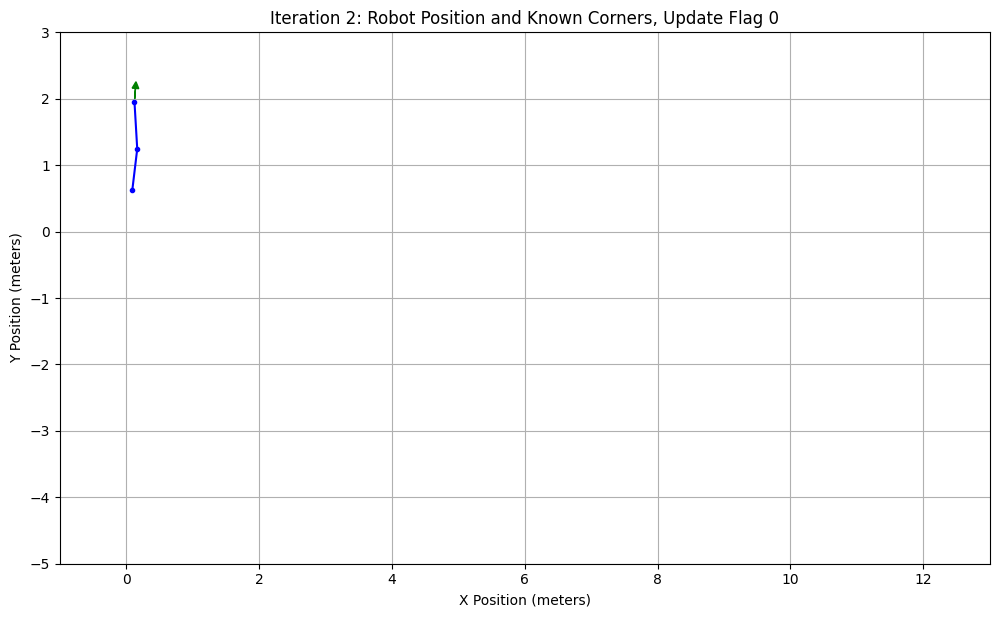

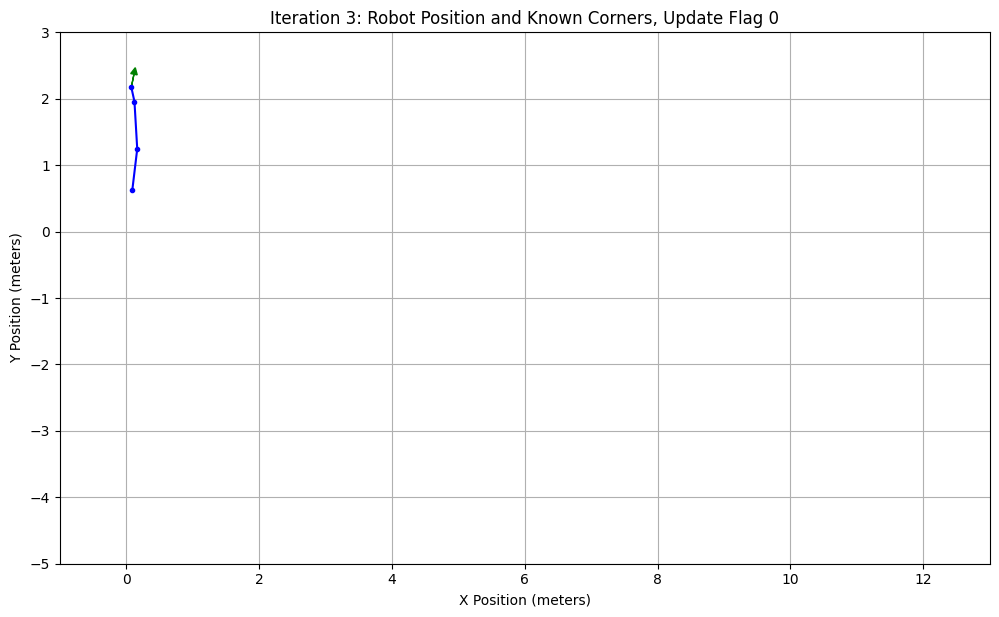

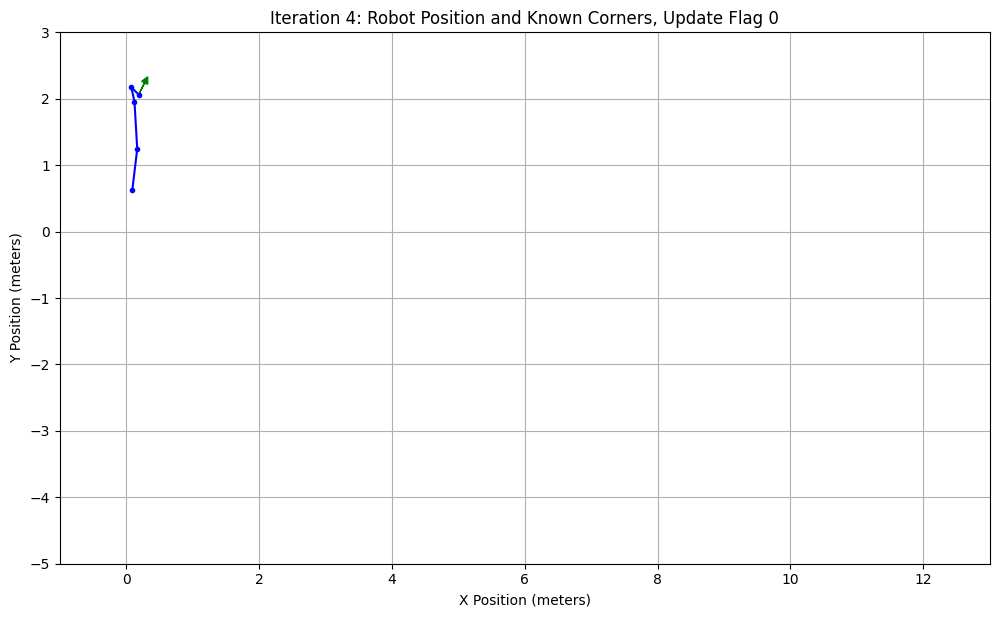

...

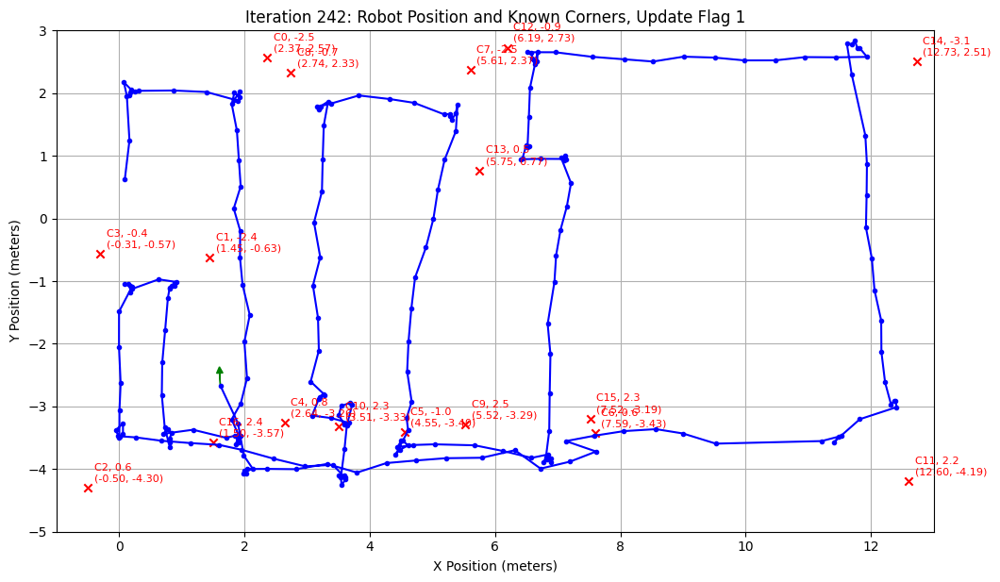

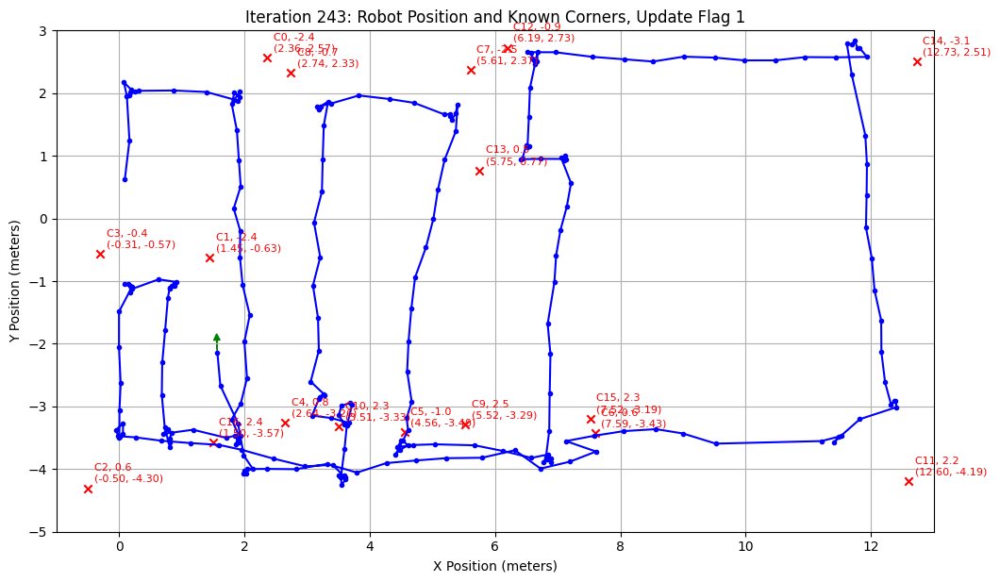

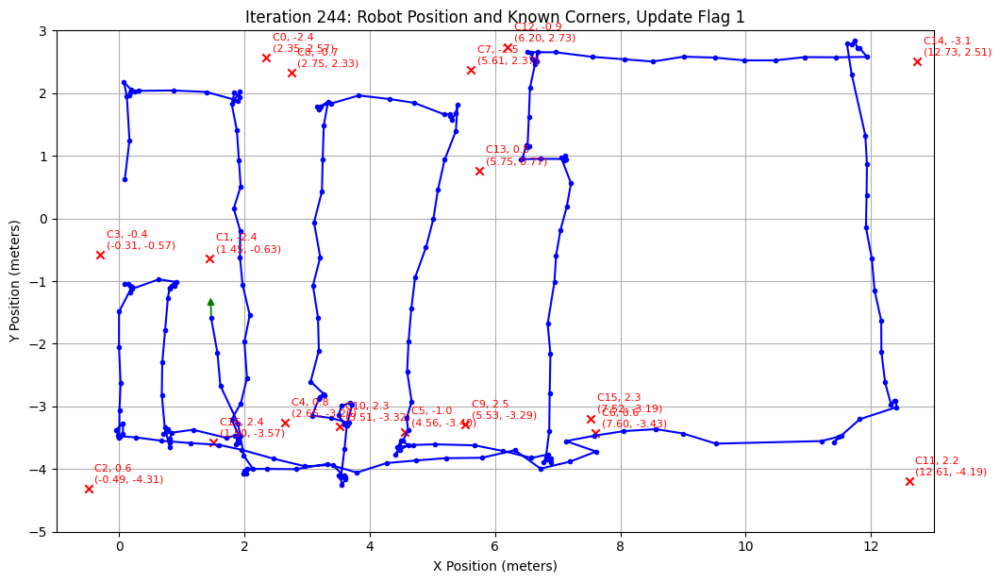

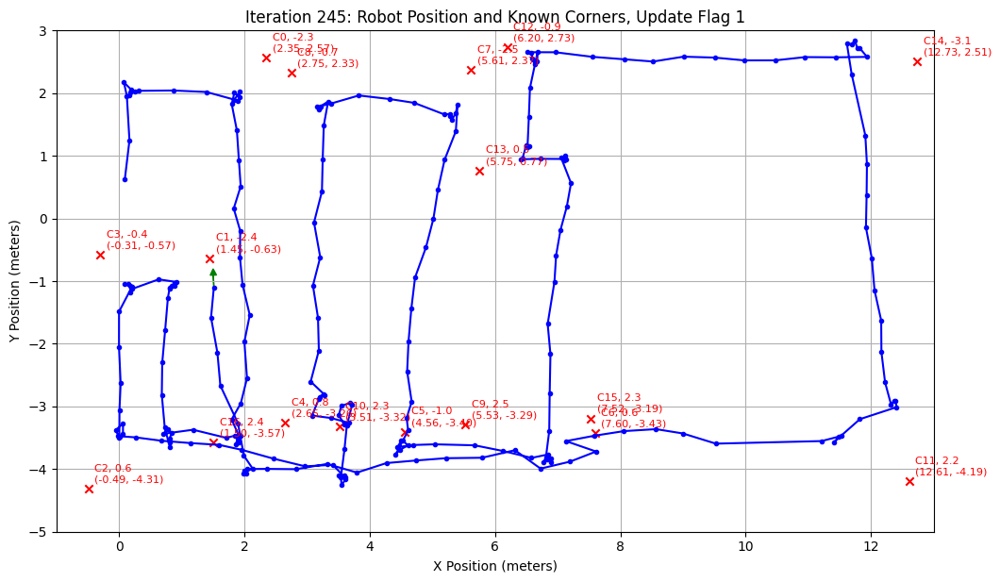

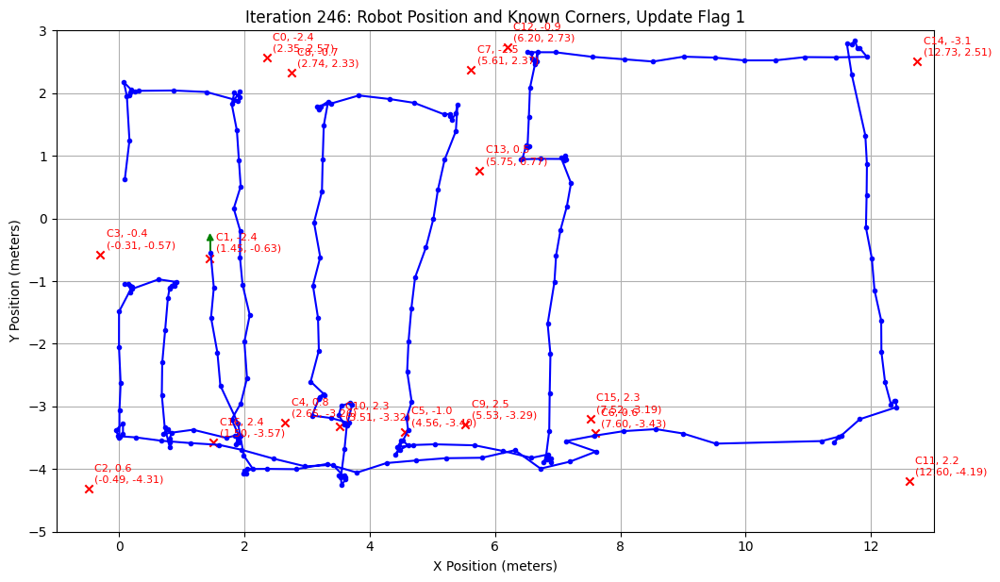

In [294]:
def lidar_to_global(x, y, th, lidar_distances, angles):
    x_robot, y_robot, theta_robot = x, y, th
    lidar_coords_global = []

    for distance, angle in zip(lidar_distances, angles):
        x_local = distance * np.cos(angle)
        y_local = distance * np.sin(angle)

        rotation_matrix = np.array([
            [np.cos(theta_robot), -np.sin(theta_robot)],
            [np.sin(theta_robot), np.cos(theta_robot)]
        ])

        lidar_local = np.array([x_local, y_local])
        lidar_global = rotation_matrix.dot(lidar_local)
        lidar_global += np.array([x_robot, y_robot])

        lidar_coords_global.append(lidar_global)
    return np.array(lidar_coords_global)


def kalman_predict(X, P, delta_pose, R):
    two_n = max(0, (len(X)-3))
    F = np.hstack((np.eye(3), np.zeros((3, two_n))))

    X = X + F.T @ delta_pose

    G_xt = np.eye(3)
    I = np.eye(two_n)
    G_t = np.block([
        [G_xt, np.zeros((3, two_n))],
        [np.zeros((two_n, 3)), I]
    ])

    P = G_t @ P @ G_t.T + F.T @ R @ F

    return X, P

def is_known_corner(corner, corner_angle, corner_type, X, known_corners_angles, known_corners_types, threshold):
    X_filt = X[3:]
    for i, (known_corner_angle, known_corner_type) in enumerate(zip(known_corners_angles, known_corners_types)):
        distance = np.sqrt((X_filt[2*i] - corner[0])**2 + (X_filt[2*i+1] - corner[1])**2)
        if distance < threshold and np.abs(np.abs(known_corner_angle)-np.abs(corner_angle))<np.pi/4: # and known_corner_type==corner_type and np.abs(np.abs(known_corner_angle)-np.abs(corner_angle))<np.pi/4
            return i
    return -1

# Função para processar leituras LIDAR e variações da pose
def kalman_update(X, P, lidar_data, angles, known_corners, corner_covariances, update_flag=0):
    corners_idx, corners_type, corners_angles, corner_coords = detect_corners_douglas_peucker(lidar_data, angles)
    corners_angles = normalize_angle(corners_angles + X[2])

    lidar_coords_global = lidar_to_global(X[0], X[1], X[2], lidar_data, angles)
    detected_corners = lidar_coords_global[corners_idx]

    for corner, corner_angle, corner_type, corner_idx in zip(detected_corners, corners_angles, corners_type, corners_idx):
        idx = is_known_corner(corner, corner_angle, corner_type, X, known_corners_angles, known_corners_types, 1.8)
        distance_from_scan_to_actual_corner = np.sqrt((X[0] - corner[0])**2 + (X[1] - corner[1])**2)
        max_distance = 6
        if idx == -1 and distance_from_scan_to_actual_corner<max_distance:  # New corner
           known_corners.append(corner)
           known_corners_angles.append(corner_angle)
           known_corners_types.append(corner_type)

           X = np.concatenate((X, corner))

           n = len(X)  # Updated state size
           P_augmented = np.zeros((n, n))
           P_augmented[:P.shape[0], :P.shape[1]] = P
           P_augmented[-2:, :-2] = 0  # Zero correlation with existing states
           P_augmented[:-2, -2:] = 0
           P_augmented[-2:, -2:] = np.eye(2) * 0.0005
           P = P_augmented
        elif (distance_from_scan_to_actual_corner<max_distance):
            update_flag=1

            # Measured Z
            z = np.array([lidar_data[corner_idx], np.deg2rad(corner_idx-30)])
            z[1] = normalize_angle(z[1])

            # Expected
            diff_hat = X[3+2*idx:3+2*idx+2] - X[0:2]
            q_hat = diff_hat.T @ diff_hat
            z_hat = np.array([np.sqrt(q_hat), np.arctan2(diff_hat[1], diff_hat[0]) - X[2]])
            z_hat[1] = normalize_angle(z_hat[1])

            low_H = np.array([[-np.sqrt(q_hat)*diff_hat[0], -np.sqrt(q_hat)*diff_hat[1], 0, np.sqrt(q_hat)*diff_hat[0], np.sqrt(q_hat)*diff_hat[1]],
                   [diff_hat[1], -diff_hat[0], -q_hat, -diff_hat[1], diff_hat[0]]]) / q_hat

            size = 2 * len(known_corners_angles)
            j = idx+1
            Fxj = np.zeros((5, 3+size))
            Fxj[0, 0] = 1
            Fxj[1, 1] = 1
            Fxj[2, 2] = 1
            Fxj[3, 3+2*j-2] = 1
            Fxj[4, 3+2*j-1] = 1

            H = low_H @ Fxj

            sdv_dist = 0.0005
            sdv_ang = 0.0001
            Q = np.diag([(np.sqrt(lidar_data[corner_idx]) * sdv_dist)**2, sdv_ang**2])

            K = P @ H.T @ np.linalg.inv(H @ P @ H.T + Q)

            X = X + K @ (z - z_hat)

            P = (np.eye(len(X)) - K @ H) @ P

            known_corners_angles[idx] = normalize_angle(corner_angle)

            X[2] = normalize_angle(X[2])
    return X, P, known_corners, update_flag


def normalize_angle(angle):
    return (angle + np.pi) % (2 * np.pi) - np.pi

def draw_robot_pose(ax, pose, color='blue', arrow_scale=0.2):
    x, y, theta = pose[0], pose[1], pose[2]
    dx = arrow_scale * np.cos(theta)
    dy = arrow_scale * np.sin(theta)
    ax.arrow(x, y, dx, dy, head_width=0.1, head_length=0.1, fc=color, ec=color)

# Simulação do sistema

poses = []           # To store [x, y, theta]
pose_variances = []  # To store [var_x, var_y, var_theta]
known_corners = []  # Mapa inicial de cantos
corner_covariances = []  # Covariâncias dos cantos
known_corners_angles = []
known_corners_types = []
corner_observation_counts = []
corner_lifetimes = []


data = np.loadtxt('/content/data_slam.txt')

pose_data = data[:, :3]
lidar_data = data[:, 3:]

angles = np.deg2rad(np.linspace(-30, 30, 61))

#MAIN LOOP
X = [0, 0, np.pi/2]
P = np.diag([0.0, 0.0, 0.0])
cov_r = 0.005
R = np.diag([cov_r**2, cov_r**2, (cov_r/3)**2])

#poses.append([0, 0, np.pi/2])
for i in range(len(lidar_data)):
  delta = pose_data[i]
  current_lidar_data = lidar_data[i]
  angles = np.deg2rad(np.linspace(-30, 30, 61))

  X, P = kalman_predict(X, P, delta, R)

  X, P, known_corners, update_flag = kalman_update(X, P, current_lidar_data, angles, known_corners, corner_covariances, update_flag=0)


  # PLOTS
  poses.append(X[0:3])
  pose_variances.append(np.diag(P))

  plt.figure(figsize=(12, 8))
  ax = plt.gca()
  poses_array = np.array(poses)
  ax.plot(poses_array[:, 0], poses_array[:, 1], linestyle="-", marker="o", markersize=3, color='blue', label="Trajectory")
  draw_robot_pose(ax, X[0:3], color='green')

  X_f = X[3:]  # Extract the corner coordinates (x1, y1, x2, y2, ..., xn, yn)

  if len(X_f) > 0:
      known_corners_array = np.array([(X_f[i], X_f[i+1]) for i in range(0, len(X_f), 2)])
      ax.scatter(known_corners_array[:, 0], known_corners_array[:, 1], c='red', marker='x', label="Known Corners")

      for j, (corner, angle) in enumerate(zip(known_corners_array, known_corners_angles)):
          ax.text(corner[0]+0.1, corner[1]+0.1, f"C{j}, {angle:.1f}\n({corner[0]:.2f}, {corner[1]:.2f})", fontsize=8, color='red')
          #ax.text(corner[0], corner[1], f"", fontsize=8, color='red')

  ax.set_title(f"Iteration {i}: Robot Position and Known Corners, Update Flag {update_flag}")
  ax.set_xlabel("X Position (meters)")
  ax.set_ylabel("Y Position (meters)")
  ax.grid()
  ax.set_xlim([-1, 13])
  ax.set_ylim([-5, 3])
  ax.set_aspect('equal', adjustable='box')
  plt.show()


## Task 3

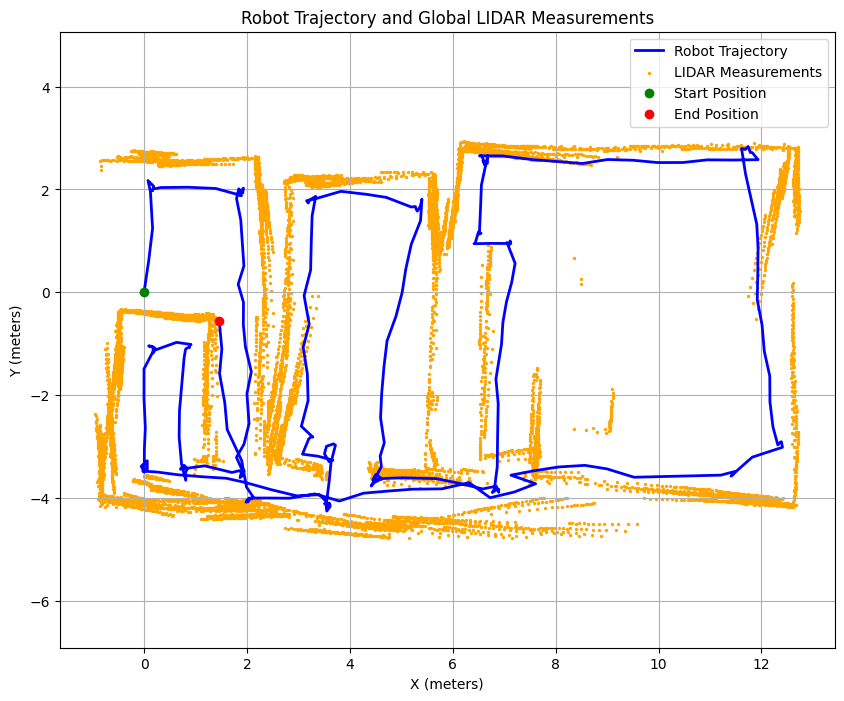

In [296]:
# Função para converter medições LIDAR para coordenadas globais
def lidar_to_global(x, y, th, lidar_distances, angles):
    x_robot, y_robot, theta_robot = x, y, th
    lidar_coords_global = []

    for distance, angle in zip(lidar_distances, angles):
        x_local = distance * np.cos(angle)
        y_local = distance * np.sin(angle)

        rotation_matrix = np.array([
            [np.cos(theta_robot), -np.sin(theta_robot)],
            [np.sin(theta_robot), np.cos(theta_robot)]
        ])

        lidar_local = np.array([x_local, y_local])
        lidar_global = rotation_matrix.dot(lidar_local)
        lidar_global += np.array([x_robot, y_robot])
        if distance < 3:
          lidar_coords_global.append(lidar_global)
    return np.array(lidar_coords_global)

# Inicializar a pose do robô e listas para armazenar a trajetória e medições LIDAR globais
pose = [0.0, 0.0, np.pi/2]
trajectory = [pose]
lidar_global_data = []

# Calcular a trajetória e medições LIDAR globais

for i in range(len(poses)):
    pose = poses[i] # Get the pose from the poses array
    lidar_distances = lidar_data[i] # Get the corresponding lidar data

    trajectory.append(pose)

    lidar_global = lidar_to_global(pose[0], pose[1], pose[2], lidar_distances, angles)
    if i > 220:
        continue
    else:
      #print(pose)
      lidar_global_data.append(lidar_global)

# Converter listas para arrays
trajectory = np.array(trajectory)
lidar_global_data = np.vstack(lidar_global_data)  # Combinar todas as medições LIDAR

# Plotar a trajetória do robô e todas as medições LIDAR globais
plt.figure(figsize=(10, 8))

# Trajetória do robô
plt.plot(trajectory[:, 0], trajectory[:, 1], color='blue', label="Robot Trajectory", linewidth=2)

# Medições LIDAR globais
plt.scatter(lidar_global_data[:, 0], lidar_global_data[:, 1], color='orange', s=2, label="LIDAR Measurements")

# Marcar a posição inicial e final do robô
plt.scatter(trajectory[0, 0], trajectory[0, 1], color='green', label="Start Position", zorder=5)
plt.scatter(trajectory[-1, 0], trajectory[-1, 1], color='red', label="End Position", zorder=5)

# Configurações do gráfico
plt.axis("equal")
plt.title("Robot Trajectory and Global LIDAR Measurements")
plt.xlabel("X (meters)")
plt.ylabel("Y (meters)")
plt.legend()
plt.grid(True)
plt.show()

<font color='red'>
Disclaimer for the use of AI tools: complete the text that is placed in between brackets. Convert this disclaimer to PDF, sign it and deliver the PDF in Moodle.
</font>

I, Bernardo de Almeida Soeiro, Rodrigo de Vasconcelos e Miguel, declare that the work presented in this assignment titled "Project 2 Parte 2" was completed independently, except where explicitly noted. I confirm the following with regard to the use of AI tools:

*Extent of AI Tool Contribution:*

I have used the following AI tool(s) for assistance in this assignment:

1. Tool(s) Used: , ChatGPT, Gemini.
Nature of Assistance: Code debugging, algorithm sugestion
2. Percentage of AI Contribution: 40%
3. Human Oversight and Contribution:
Despite the use of AI tools, I confirm that the critical thinking, analysis, problem-solving, and final decision-making processes in this assignment were carried out by me. The AI tools were used solely as support for the following purposes:Correcting code, research algorithms


*Originality and Integrity:*
I take full responsibility for ensuring that the content of this assignment is original and properly cited where applicable. The use of AI tools did not result in any unintentional plagiarism or misrepresentation of ideas from external sources.

*Compliance with Academic Integrity Guidelines:*
I understand the importance of academic integrity, and I confirm that the usage of AI tools complies with the guidelines provided by FEUP. All AI-generated outputs were critically evaluated and appropriately incorporated into the final submission.

Signed,
Bernardo de Almeida Soeiro
Rodrigo de Vasconcelos e Miguel